# MAST30034 Applied Data Science Project 1 Visualisation

Student Name: Haonan Zhong

Student ID: 867492

In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import contextily as ctx
import warnings

plt.style.use('ggplot')
warnings.filterwarnings("ignore")

In [2]:
# read dataset
yellow_data = pd.read_feather('../preprocessed_data/cleaned_2018.feather')

In [3]:
# split data according to season
yellow_winter = yellow_data[yellow_data['season'] == 'winter'].reset_index(drop=True)
yellow_summer = yellow_data[yellow_data['season'] == 'summer'].reset_index(drop=True)

# Pickup and dropoff frequency in each taxi zone

In [4]:
# Read in the taxi zone shapefile
sf = gpd.read_file('../raw_data/taxi_zones/taxi_zones.shp')
zone = pd.read_csv("../raw_data/taxi_zone_lookup.csv")
sf['geometry'] = sf['geometry'].to_crs('+proj=longlat +ellps=WGS84 +datum=WGS84 +no_defs')

In [5]:
# Compute pickup and dropoff amount of each zone
pu_zone = yellow_data.groupby(['PULocationID'], as_index=False).size()
do_zone = yellow_data.groupby(['DOLocationID'], as_index=False).size()
pu_zone = gpd.GeoDataFrame(pd.merge(pu_zone, sf, left_on='PULocationID', right_on='LocationID')).drop('LocationID', axis=1)
do_zone = gpd.GeoDataFrame(pd.merge(do_zone, sf, left_on='DOLocationID', right_on='LocationID')).drop('LocationID', axis=1)
pu_zone = pu_zone.to_crs(epsg=3857)
do_zone = do_zone.to_crs(epsg=3857)

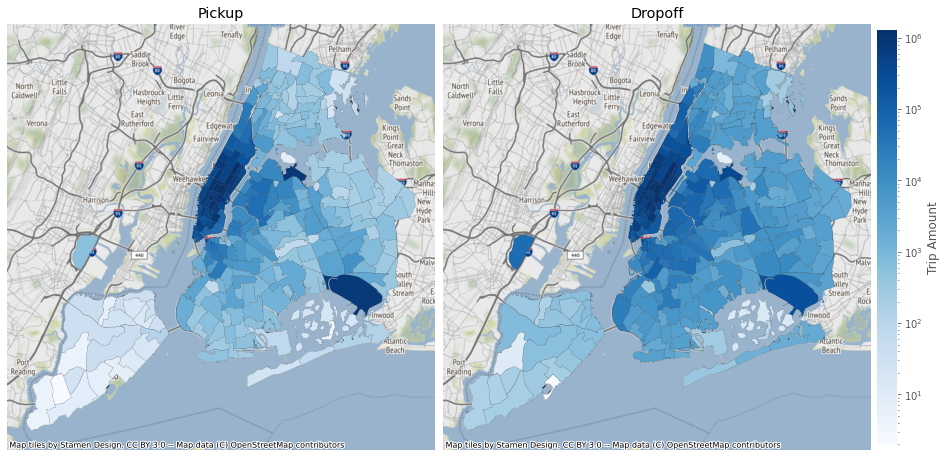

In [6]:
# plot geospatial visualisation to compare pickup and dropoff amount from each zone
fig, axs = plt.subplots(ncols=2, figsize=(20, 10))
fig.subplots_adjust(bottom=0.1, top=0.9, left=0.09, right=0.8, wspace=0.02, hspace=0.02)
# create a normalized colorbar
vmin, vmax = pu_zone['size'].min(), pu_zone['size'].max()
axs[0] = pu_zone.plot(column='size', linewidth=0.09, edgecolor='k', figsize=(10, 10), 
    norm=colors.LogNorm(vmin=vmin, vmax=vmax), cmap='Blues', legend=False, ax=axs[0]) 
ctx.add_basemap(axs[0])
vmin, vmax = do_zone['size'].min(), do_zone['size'].max()
axs[1] = do_zone.plot(column='size', linewidth=0.1, edgecolor='k', figsize=(10, 10), 
    norm=colors.LogNorm(vmin=vmin, vmax=vmax), cmap='Blues', legend=False, ax=axs[1])
ctx.add_basemap(axs[1])
axs[0].set_title('Pickup')
axs[1].set_title('Dropoff')
axs[0].set_axis_off()
axs[1].set_axis_off()
# draw the color bar
patch_col = axs[0].collections[0]
cb = fig.colorbar(patch_col, ax=axs, shrink=0.72, orientation="vertical", pad=0.005)
cb.ax.set_ylabel('Trip Amount')
plt.show()

# How does time and day affect the usage of taxi?

In [7]:
# Compute number of pickups at each hour through out the week
cats = [ 'Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
winter_pu_count = pd.crosstab(yellow_winter['weekday'], yellow_winter['time'])
winter_pu_count = winter_pu_count.reindex(cats, axis=0)

summer_pu_count = pd.crosstab(yellow_summer['weekday'], yellow_summer['time'])
summer_pu_count = summer_pu_count.reindex(cats, axis=0)

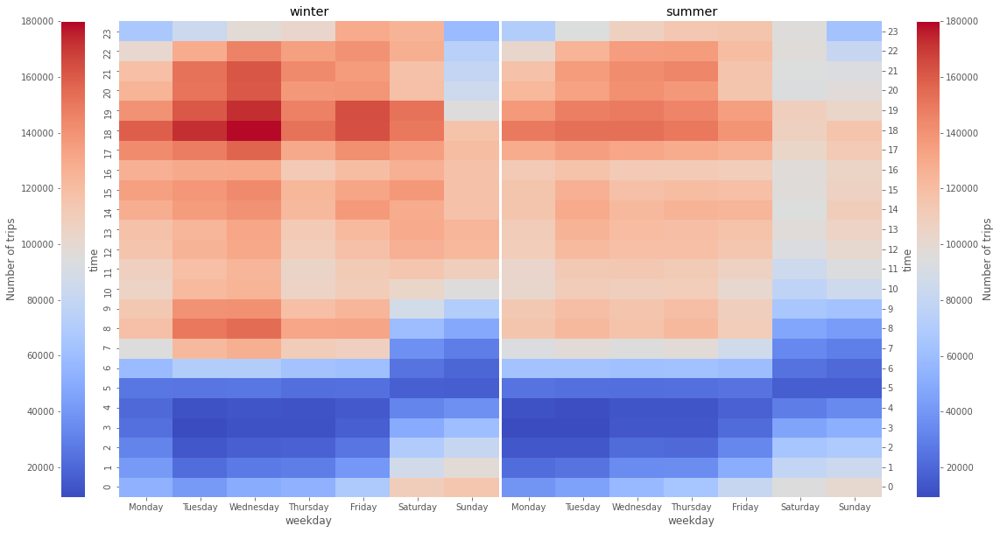

In [8]:
fig, (ax,ax2) = plt.subplots(ncols=2, figsize=(20, 10))
fig.subplots_adjust(wspace=0.005)
day_hour_winter = sns.heatmap(winter_pu_count.transpose(), ax=ax, cmap="coolwarm", vmax=180000, cbar=False)
fig.colorbar(ax.collections[0], label='Number of trips', ax=ax,location="left", use_gridspec=False, pad=0.07)
day_hour_summer = sns.heatmap(summer_pu_count.transpose(), ax=ax2, cmap="coolwarm", vmax=180000, cbar=False)
fig.colorbar(ax2.collections[0], label='Number of trips', ax=ax2,location="right", use_gridspec=False, pad=0.07)
day_hour_winter.invert_yaxis()
day_hour_summer.invert_yaxis()
ax.set_title('winter')
ax2.set_title('summer')
ax2.yaxis.set_label_position("right")
ax2.yaxis.tick_right()
ax2.tick_params(rotation=0)
plt.show()

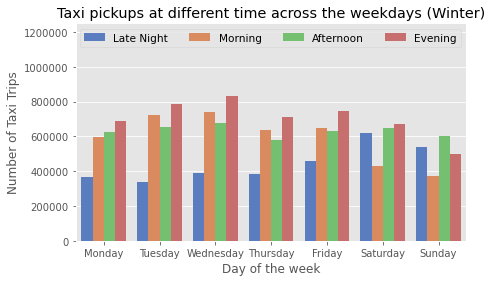

In [9]:
wt = pd.crosstab(yellow_winter['weekday'], yellow_winter['time_desc']).reindex(cats, axis=0)
stacked_winter = wt.stack().reset_index().rename(columns={0:'pick_ups'})
time_order = ['Late Night', 'Morning', 'Afternoon', 'Evening']
stacked_winter.time_desc = pd.Categorical(stacked_winter.time_desc, categories=time_order)

fig, ax = plt.subplots(figsize=(7,4))
sns.barplot(x=stacked_winter.weekday, y=stacked_winter.pick_ups, hue=stacked_winter.time_desc, ax=ax, palette = 'muted')
ax.set_ylabel('Number of Taxi Trips')
ax.set_xlabel('Day of the week')
ax.set_title('Taxi pickups at different time across the weekdays (Winter)')
plt.ticklabel_format(style='plain', axis='y')
plt.ylim(0, 1250000)
plt.legend(loc=1, ncol=len(stacked_winter.time_desc), prop={'size': 10.5})
plt.show()

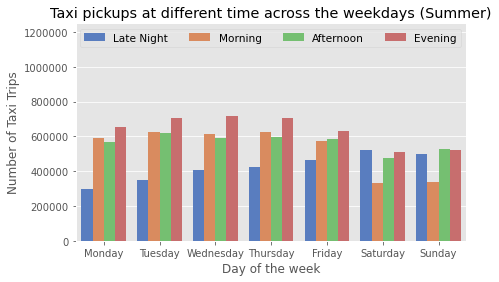

In [10]:
sm = pd.crosstab(yellow_summer['weekday'], yellow_summer['time_desc']).reindex(cats, axis=0)
stacked_summer = sm.stack().reset_index().rename(columns={0:'pick_ups'})
stacked_summer.time_desc = pd.Categorical(stacked_summer.time_desc, categories=time_order)

fig, ax = plt.subplots(figsize=(7,4))
sns.barplot(x=stacked_summer.weekday, y=stacked_summer.pick_ups, hue=stacked_summer.time_desc, ax=ax, palette = 'muted', )
ax.set_ylabel('Number of Taxi Trips')
ax.set_xlabel('Day of the week')
ax.set_title('Taxi pickups at different time across the weekdays (Summer)')
plt.ticklabel_format(style='plain', axis='y')
plt.ylim(0, 1250000)
plt.legend(loc=1, ncol=len(stacked_summer.time_desc), prop={'size': 10.5})
plt.show()

# What is passenger's tipping behaviour？

In [11]:
# filter payment type cash, since tips are not recorded in cash payment
tip = yellow_data[yellow_data['payment_type'] != 2]

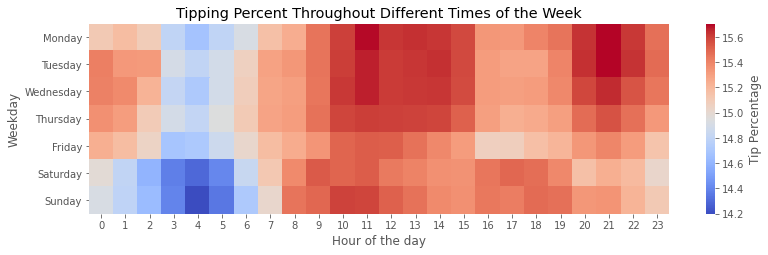

In [12]:
# compute the tipping percentage in each hour through the week
tip_percent = tip.groupby(['weekday', 'time'], as_index=False)['tip_percent'].mean()
tip_percent.weekday = pd.Categorical(tip_percent.weekday, categories=cats)
tip_percent = tip_percent.sort_values(['weekday', 'time']).reset_index(drop=True)
tip_percent_heatmap = pd.pivot_table(tip_percent, values='tip_percent', index='weekday', columns='time')

fig, ax = plt.subplots(figsize=(13, 3.5))
sns.heatmap(tip_percent_heatmap, cbar_kws={'label': 'Tip Percentage'}, ax=ax, cmap='coolwarm')
ax.set_ylabel('Weekday')
ax.set_xlabel('Hour of the day')
ax.set_title('Tipping Percent Throughout Different Times of the Week')
plt.show()

In [13]:
do_tip = tip.groupby(['DOLocationID'], as_index=False)['tip_amount'].mean()
do_gdf = gpd.GeoDataFrame(pd.merge(do_tip, sf, left_on='DOLocationID', right_on='LocationID')).drop('DOLocationID',axis=1)

# idenitify missing taxi zone
missing_list = list(set(sf['OBJECTID']) - set(do_gdf['OBJECTID']))
missing = sf[sf['OBJECTID'].isin(missing_list)]
missing.insert(0, 'tip_amount', np.nan, True)
missing = missing.drop('LocationID', axis=1)
do_gdf = pd.concat([do_gdf, missing]).reset_index().drop('LocationID', axis=1)
do_gdf = do_gdf.rename({'OBJECTID':'LocationID'}, axis=1)
do_gdf = do_gdf.to_crs(epsg=3857)

In [14]:
pu_tip = tip.groupby(['PULocationID'], as_index=False)['tip_amount'].mean()
pu_gdf = gpd.GeoDataFrame(pd.merge(pu_tip, sf, left_on='PULocationID', right_on='LocationID')).drop('PULocationID',axis=1)

# idenitify missing taxi zone
missing_list = list(set(sf['OBJECTID']) - set(pu_gdf['OBJECTID']))
missing = sf[sf['OBJECTID'].isin(missing_list)]
missing.insert(0, 'tip_amount', np.nan, True)
missing = missing.drop('LocationID', axis=1)
pu_gdf = pd.concat([pu_gdf, missing]).reset_index().drop('LocationID', axis=1)
pu_gdf = pu_gdf.rename({'OBJECTID':'LocationID'}, axis=1)
pu_gdf = pu_gdf.to_crs(epsg=3857)

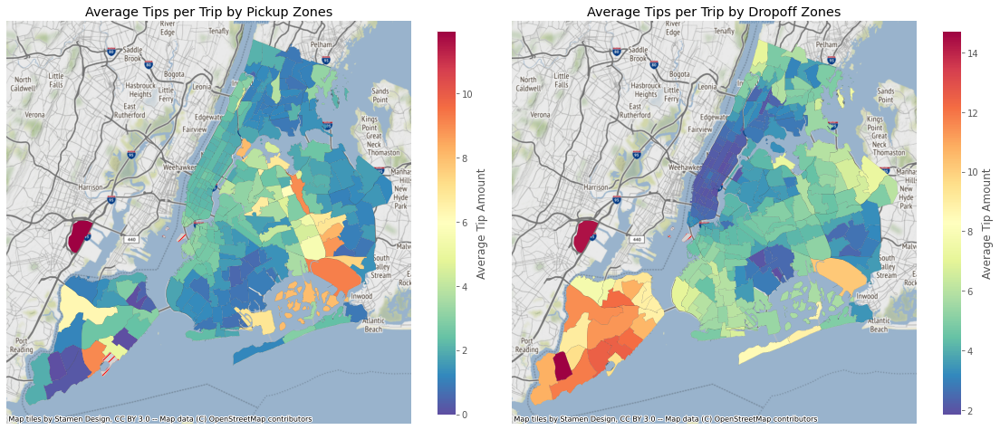

In [15]:
fig, axs = plt.subplots(ncols=2, figsize=(20, 10))
vmin, vmax = pu_gdf['tip_amount'].min(), pu_gdf['tip_amount'].max()
pu_gdf.plot(column='tip_amount', cmap='Spectral_r', linewidth=0.05, ax=axs[0], edgecolor='k',
    legend=True, legend_kwds={'label': "Average Tip Amount", 'shrink': 0.78}, vmin=vmin, vmax=vmax, 
    missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///", "label": "Missing values"})

vmin, vmax = do_gdf['tip_amount'].min(), do_gdf['tip_amount'].max()
do_gdf.plot(column='tip_amount', cmap='Spectral_r', linewidth=0.05, ax=axs[1], edgecolor='k',
    legend=True, legend_kwds={'label': "Average Tip Amount", 'shrink': 0.78}, vmin=vmin, vmax=vmax,
    missing_kwds={"color": "lightgrey", "edgecolor": "red", "hatch": "///", "label": "Missing values"})

fig.subplots_adjust(wspace=0)
ctx.add_basemap(axs[0])
ctx.add_basemap(axs[1])
axs[0].set_axis_off()
axs[1].set_axis_off()
axs[0].set_title("Average Tips per Trip by Pickup Zones")
axs[1].set_title("Average Tips per Trip by Dropoff Zones")
plt.show()

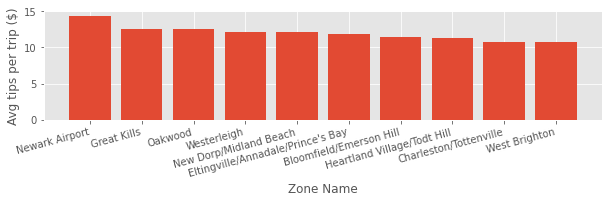

In [16]:
# identify top 10 zone with highest average tips
top_10 = pd.merge(do_gdf, tip['DOLocationID'].value_counts().sort_index(), left_on='LocationID', right_on=tip['DOLocationID'].value_counts().sort_index().index)
top_10 = top_10.rename({'DOLocationID': 'Pickup_freq'}, axis=1)
top_10 = top_10[top_10['Pickup_freq'] > 100]
top_10 = top_10.sort_values('tip_amount', ascending=False)[:10]

fig, ax = plt.subplots(figsize=(10, 2))
ax.bar(top_10['zone'], top_10['tip_amount'])
ax.set_xlabel('Zone Name')
ax.set_ylabel('Avg tips per trip ($)')
plt.xticks(rotation=15,horizontalalignment="right")
plt.show()

# How does weather affect the usage of taxi?

In [17]:
# Group and count trip based on date and weather condition

winter_prcp = pd.DataFrame(yellow_winter.groupby(['date', 'PRCP']).size()).reset_index()
summer_prcp = pd.DataFrame(yellow_summer.groupby(['date', 'PRCP']).size()).reset_index()
winter_prcp.columns = ['date', 'PRCP', 'pickup_freq']
summer_prcp.columns = ['date', 'PRCP', 'pickup_freq']

winter_awnd = pd.DataFrame(yellow_winter.groupby(['date', 'AWND']).size()).reset_index()
summer_awnd = pd.DataFrame(yellow_summer.groupby(['date', 'AWND']).size()).reset_index()
winter_awnd.columns = ['date', 'AWND', 'pickup_freq']
summer_awnd.columns = ['date', 'AWND', 'pickup_freq']

winter_snow = pd.DataFrame(yellow_winter.groupby(['date', 'SNOW']).size()).reset_index()
summer_snow = pd.DataFrame(yellow_summer.groupby(['date', 'SNOW']).size()).reset_index()
winter_snow.columns = ['date', 'SNOW', 'pickup_freq']
summer_snow.columns = ['date', 'SNOW', 'pickup_freq']

winter_snwd = pd.DataFrame(yellow_winter.groupby(['date', 'SNWD']).size()).reset_index()
summer_snwd = pd.DataFrame(yellow_summer.groupby(['date', 'SNWD']).size()).reset_index()
winter_snwd.columns = ['date', 'SNWD', 'pickup_freq']
summer_snwd.columns = ['date', 'SNWD', 'pickup_freq']

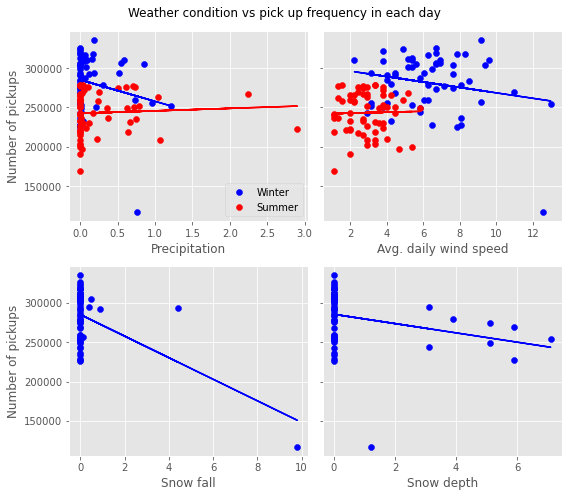

In [18]:
# Plot total trip amount against different weather conditions

fig, axs = plt.subplots(2, 2, figsize=(8, 7), sharey=True)
z = np.polyfit(winter_prcp['PRCP'], winter_prcp['pickup_freq'], 1)
p = np.poly1d(z)
axs[0, 0].plot(winter_prcp['PRCP'],p(winter_prcp['PRCP']), c='b')
axs[0, 0].scatter(winter_prcp['PRCP'], winter_prcp['pickup_freq'], c='b', label='Winter')
z = np.polyfit(summer_prcp['PRCP'], summer_prcp['pickup_freq'], 1)
p = np.poly1d(z)
axs[0, 0].plot(summer_prcp['PRCP'],p(summer_prcp['PRCP']), c='r')
axs[0, 0].scatter(summer_prcp['PRCP'], summer_prcp['pickup_freq'], c='r', label='Summer')
axs[0, 0].set_xlabel('Precipitation')
axs[0, 0].set_ylabel('Number of pickups')

z = np.polyfit(winter_awnd['AWND'], winter_awnd['pickup_freq'], 1)
p = np.poly1d(z)
axs[0, 1].plot(winter_awnd['AWND'],p(winter_awnd['AWND']), c='b')
axs[0, 1].scatter(winter_awnd['AWND'], winter_awnd['pickup_freq'], c='b', label='Winter')
z = np.polyfit(summer_awnd['AWND'], summer_awnd['pickup_freq'], 1)
p = np.poly1d(z)
axs[0, 1].plot(summer_awnd['AWND'],p(summer_awnd['AWND']), c='r')
axs[0, 1].scatter(summer_awnd['AWND'], summer_awnd['pickup_freq'], c='r', label='Summer')
axs[0, 1].set_xlabel('Avg. daily wind speed')

z = np.polyfit(winter_snow['SNOW'], winter_snow['pickup_freq'], 1)
p = np.poly1d(z)
axs[1, 0].plot(winter_snow['SNOW'],p(winter_snow['SNOW']), c='b')
axs[1, 0].scatter(winter_snow['SNOW'], winter_snow['pickup_freq'], c='b', label='Winter')
axs[1, 0].set_xlabel('Snow fall')
axs[1, 0].set_ylabel('Number of pickups')

z = np.polyfit(winter_snwd['SNWD'], winter_snow['pickup_freq'], 1)
p = np.poly1d(z)
axs[1, 1].plot(winter_snwd['SNWD'],p(winter_snwd['SNWD']), c='b')
axs[1, 1].scatter(winter_snwd['SNWD'], winter_snwd['pickup_freq'], c='b', label='Winter')
axs[1, 1].set_xlabel('Snow depth')
axs[0, 0].legend(loc=4)
plt.suptitle('Weather condition vs pick up frequency in each day')
fig.tight_layout()
plt.show()